In [3]:
import pandas
from sklearn.decomposition import PCA
from sklearn import preprocessing
import matplotlib.pyplot as plt
import numpy
import matplotlib
from matplotlib.patches import Ellipse
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import umap
from scipy.stats import zscore
import hdbscan
import seaborn
import hsluv
import tifffile

In [4]:
writebatch='20210927'
input_df = pandas.read_excel('../data/76 brain input tracing dataset.xlsx',header=1)
input_df.head()

C:\ProgramData\Anaconda3\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning:

Unknown extension is not supported and will be removed



,Experimental condition,Cre line:,Output site:,% starter cells that are TH+,total rabies-labeled input cells,Cortex,NAcMed,NAcLat,NAcCore,DStr,...,LH,ZI,DR,LDT,PBN,DCN,XCoordCOM,YCoordCOM,ZCoordCOM,Unnamed: 30
0,cTRIO DAT-CreBLA 3,DAT-Cre,Amygdala,100,1727,1.563405,1.215981,2.779386,1.563405,5.037638,...,5.037638,4.863926,25.883034,0.579039,12.680950,1.215981,1140.648,1228.338000,4.661972,NaN
1,cTRIO DAT-CreBLA 4,DAT-Cre,Amygdala,100,244,2.459016,0.000000,2.459016,0.000000,3.688525,...,15.983607,3.688525,29.508197,0.409836,8.606557,0.409836,1202.733,1113.200000,7.000000,NaN
2,cTRIO DAT-CreBLA 5,DAT-Cre,Amygdala,88,614,0.488599,0.000000,0.000000,0.488599,0.000000,...,7.328990,9.283388,23.941368,0.977199,11.726384,0.325733,1157.273,1219.727000,5.090909,NaN
3,cTRIO DAT-CreBLA 6,DAT-Cre,Amygdala,92,604,4.470199,6.953642,2.980132,1.490066,1.986755,...,8.443709,12.913907,49.668874,0.827815,3.973510,0.993377,1227.500,1163.666667,5.666667,NaN
4,cTRIO DAT-CreNAcLat 1,DAT-Cre,NAcLat,95,36581,8.783248,6.437768,5.330636,8.865258,11.030316,...,6.355758,4.141494,8.291189,0.451054,5.486455,0.923977,1120.353,1221.481000,5.358289,NaN


In [5]:
input_df['Cre line:'].unique()

array(['DAT-Cre', 'GAD2-Cre', 'vGluT2-Cre', nan], dtype=object)

In [6]:
input_df.shape

(76, 31)

In [7]:
experimental_conditions = input_df['Experimental condition'].values.tolist()

In [8]:
exp_metadata={}
for exp_cond in experimental_conditions:
    #print(exp_cond)
    row=input_df.loc[input_df['Experimental condition']==exp_cond]
    exp_metadata[exp_cond]={}
    exp_metadata[exp_cond]['Cre line']=row['Cre line:'].values[0]
    exp_metadata[exp_cond]['Output site']=row['Output site:'].values[0]
    exp_metadata[exp_cond]['total rabies-labeled input cells']=row['total rabies-labeled input cells'].values[0]
    x=row['XCoordCOM'].values[0]
    y=row['YCoordCOM'].values[0]
    z=row['ZCoordCOM'].values[0]
    exp_metadata[exp_cond]['COM']=(x,y,z)

In [9]:
input_df.columns

Index(['Experimental condition', 'Cre line:', 'Output site:',
       '% starter cells that are TH+', 'total rabies-labeled input cells',
       'Cortex', 'NAcMed', 'NAcLat', 'NAcCore', 'DStr', 'VP', 'PO', 'Septum',
       'BNST', 'EAM', 'EP', 'Gpe', 'PVH', 'LHb', 'MHb', 'CeA', 'LH', 'ZI',
       'DR', 'LDT', 'PBN', 'DCN', 'XCoordCOM', 'YCoordCOM', 'ZCoordCOM',
       'Unnamed: 30'],
      dtype='object')

In [10]:
input_df[['Experimental condition', 'Cre line:', 'Output site:']]

,Experimental condition,Cre line:,Output site:
0,cTRIO DAT-CreBLA 3,DAT-Cre,Amygdala
1,cTRIO DAT-CreBLA 4,DAT-Cre,Amygdala
2,cTRIO DAT-CreBLA 5,DAT-Cre,Amygdala
3,cTRIO DAT-CreBLA 6,DAT-Cre,Amygdala
4,cTRIO DAT-CreNAcLat 1,DAT-Cre,NAcLat
...,...,...,...
71,TRIO PFC5,NaN,mPFC
72,VGluT2 1,vGluT2-Cre,NaN
73,VGluT2 2,vGluT2-Cre,NaN
74,VGluT2 3,vGluT2-Cre,NaN


In [11]:
cols= ['Cortex', 'NAcMed', 'NAcLat', 'NAcCore', 'DStr', 'VP', 'PO', 'Septum',
       'BNST', 'EAM', 'EP', 'Gpe', 'PVH', 'LHb', 'MHb', 'CeA', 'LH', 'ZI',
       'DR', 'LDT', 'PBN', 'DCN']

In [12]:
len(cols)

22

In [13]:
input_df

,Experimental condition,Cre line:,Output site:,% starter cells that are TH+,total rabies-labeled input cells,Cortex,NAcMed,NAcLat,NAcCore,DStr,...,LH,ZI,DR,LDT,PBN,DCN,XCoordCOM,YCoordCOM,ZCoordCOM,Unnamed: 30
0,cTRIO DAT-CreBLA 3,DAT-Cre,Amygdala,100,1727,1.563405,1.215981,2.779386,1.563405,5.037638,...,5.037638,4.863926,25.883034,0.579039,12.680950,1.215981,1140.648000,1228.338000,4.661972,NaN
1,cTRIO DAT-CreBLA 4,DAT-Cre,Amygdala,100,244,2.459016,0.000000,2.459016,0.000000,3.688525,...,15.983607,3.688525,29.508197,0.409836,8.606557,0.409836,1202.733000,1113.200000,7.000000,NaN
2,cTRIO DAT-CreBLA 5,DAT-Cre,Amygdala,88,614,0.488599,0.000000,0.000000,0.488599,0.000000,...,7.328990,9.283388,23.941368,0.977199,11.726384,0.325733,1157.273000,1219.727000,5.090909,NaN
3,cTRIO DAT-CreBLA 6,DAT-Cre,Amygdala,92,604,4.470199,6.953642,2.980132,1.490066,1.986755,...,8.443709,12.913907,49.668874,0.827815,3.973510,0.993377,1227.500000,1163.666667,5.666667,NaN
4,cTRIO DAT-CreNAcLat 1,DAT-Cre,NAcLat,95,36581,8.783248,6.437768,5.330636,8.865258,11.030316,...,6.355758,4.141494,8.291189,0.451054,5.486455,0.923977,1120.353000,1221.481000,5.358289,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,TRIO PFC5,NaN,mPFC,13,2945,5.059423,1.324278,1.222411,0.713073,0.000000,...,10.526316,40.848896,14.533107,0.135823,1.222411,0.679117,1243.429000,1094.000000,8.142857,NaN
72,VGluT2 1,vGluT2-Cre,NaN,66,990,4.848485,1.212121,4.545455,5.151515,9.696970,...,5.151515,13.030303,15.151515,0.606061,8.181818,9.393939,1170.428571,1216.714286,5.333300,NaN
73,VGluT2 2,vGluT2-Cre,NaN,70,343,0.874636,4.373178,3.498542,3.498542,6.122449,...,4.373178,19.241983,9.620991,2.915452,13.119534,16.618076,1096.615385,1211.307692,6.076923,NaN
74,VGluT2 3,vGluT2-Cre,NaN,39,707,2.545969,1.697313,1.272984,2.545969,2.545969,...,7.637907,10.183876,28.005658,0.282885,12.305516,2.545969,1117.153846,1156.269231,5.807692,NaN


# Make PCA Map

<IPython.core.display.Javascript object>


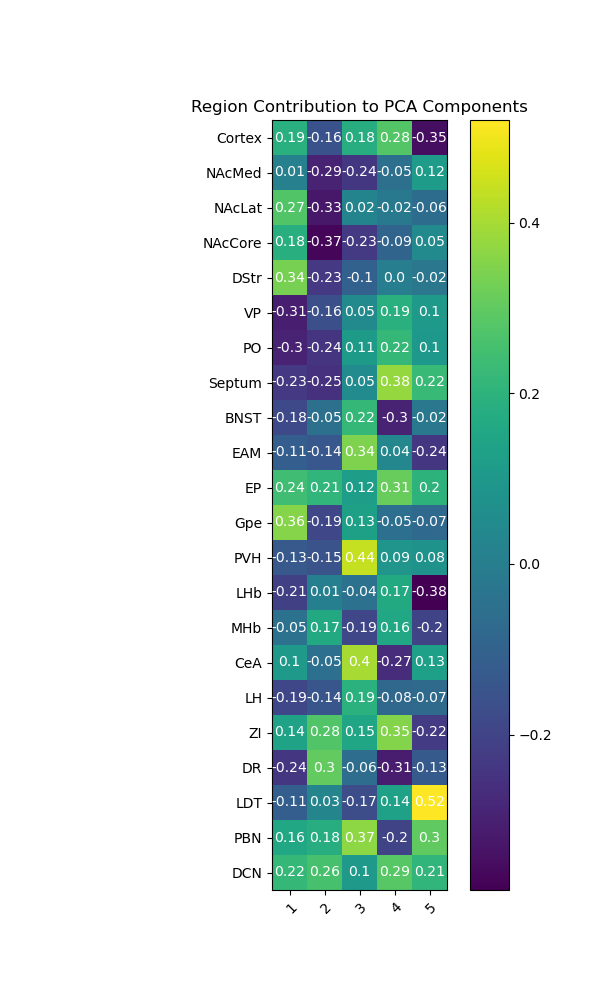

In [14]:
scaled_features = preprocessing.scale(input_df[cols])
pca_scaled = PCA(n_components=5)
pca_scaled.fit(scaled_features)
pca_scaled_embedding = pca_scaled.transform(scaled_features)

pca_components = pca_scaled.components_
pca_components = numpy.transpose(pca_components)

regions=cols

fig, ax = plt.subplots(figsize=(6,10))
im = ax.imshow(pca_components,cmap='viridis')

ax.set_xticks(numpy.arange(5))
ax.set_yticks(numpy.arange(len(regions)))
# ... and label them with the respective list entries
ax.set_xticklabels([1,2,3,4,5])
ax.set_yticklabels(regions)

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(len(regions)):
    for j in range(5):
        text = ax.text(j, i, pca_components[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("Region Contribution to PCA Components")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)

In [15]:
input_df['condition']=[condition.rstrip("0123456789").rstrip() 
                       for condition in input_df['Experimental condition'].values]
conditions=numpy.unique([condition.rstrip("0123456789").rstrip() 
                         for condition in input_df['Experimental condition'].values])
conditions

array(['DAT-Cre', 'DAT-Cre 100 nL', 'DAT-Cre 66T', 'Gad2Cre 100 nL',
       'TRIO BLA', 'TRIO NAcLat', 'TRIO NAcMed', 'TRIO PFC', 'VGluT2',
       'VGlut2', 'cTRIO DAT-CreBLA', 'cTRIO DAT-CreNAcLat',
       'cTRIO DAT-CreNAcMed', 'cTRIO DAT-CrePFC', 'cTRIO GAD2-Cre BLA',
       'cTRIO GAD2-Cre NAcLat', 'cTRIO GAD2-Cre PFC',
       'cTRIO VGluT2-Cre BLA', 'cTRIO VGluT2-Cre NAcLat',
       'cTRIO VGluT2-Cre NAcMed', 'cTRIO VGluT2-Cre PFC'], dtype='<U23')

In [16]:
exp_cre_conditions = input_df['Cre line:'].values.tolist()

cre_conditions=numpy.unique(exp_cre_conditions)
cre_conditions



exp_output_conditions = input_df['Output site:'].values.tolist()

output_conditions=numpy.unique(exp_output_conditions)
output_conditions

array(['Amygdala', 'NAcLat', 'NAcMed', 'mPFC', 'nan'], dtype='<U8')

In [15]:
cmap=plt.get_cmap('rainbow')
colors = cmap(numpy.linspace(0, 1, len(cre_conditions)))
colors_hex=[matplotlib.colors.rgb2hex(l) for l in colors]
color={}
for i,cond in enumerate(cre_conditions):
    color[cond]=colors_hex[i]

color=input_df['Cre line:'].map(color)

fig = make_subplots(rows=1, cols=2, 
                    subplot_titles=('Cell Types','Projections')
                   )

fig.add_trace(
    go.Scatter(
    y=pca_scaled_embedding[:, 1],
    x=pca_scaled_embedding[:, 0],
    mode='markers',
    marker_color=color,
    text=input_df['Experimental condition'],
    hoverinfo="text"
    ),
    row=1, col=1
)


cmap=plt.get_cmap('rainbow')
colors = cmap(numpy.linspace(0, 1, len(output_conditions)))
colors_hex=[matplotlib.colors.rgb2hex(l) for l in colors]
color={}
for i,cond in enumerate(output_conditions):
    color[cond]=colors_hex[i]

color=input_df['Output site:'].map(color)


fig.add_trace(
    go.Scatter(
    y=pca_scaled_embedding[:, 1],
    x=pca_scaled_embedding[:, 0],
    mode='markers',
    marker_color=color,
    text=input_df['Experimental condition'],
    hoverinfo="text"
    ),
    row=1, col=2
)

fig.update_xaxes(title_text="PCA 1D", row=1, col =1, showgrid=False, zeroline=False)
fig.update_yaxes(title_text="PCA 2D", row=1, col =1, showgrid=False, zeroline=False)
fig.update_xaxes(title_text="PCA 1D", row=1, col =2, showgrid=False, zeroline=False)
fig.update_yaxes(title_text="PCA 2D", row=1, col =2, showgrid=False, zeroline=False)


fig.update_layout(height=600, width=1000,showlegend=False,
                  title={
                    'text': "VTA Inputs PCA By Cell Type and Projections",
                    'x': 0.5
    })
fig.show()

In [31]:
pca_x = pca_scaled_embedding[:,0]; pca_y = pca_scaled_embedding[:,1]

In [32]:
def cart2pol(x, y):
    rho = numpy.sqrt(x**2 + y**2)
    phi = numpy.arctan2(y, x)
    return(rho, phi)

In [33]:
pca_rho,pca_phi=cart2pol(pca_x,pca_y)

In [34]:
pca_phi_norm=(pca_phi-numpy.min(pca_phi))/(numpy.max(pca_phi)-numpy.min(pca_phi))

In [35]:
s_list=[]
for i,_ in enumerate(pca_rho):
    s = 100 * pca_rho[i]/numpy.max(pca_rho)
    s_list.append(s)

In [36]:
opacity=[]
for i,_ in enumerate(s_list):
    opacity.append(0.3+0.7*s_list[i]/numpy.max(s_list))

In [37]:
cmap=plt.get_cmap('hsv')
colors = cmap(pca_phi_norm)
colors_hsv=[matplotlib.colors.rgb2hex(l) for l in colors]

fig=go.Figure(data=go.Scatter(
    y=pca_scaled_embedding[:, 1],
    x=pca_scaled_embedding[:, 0],
    mode='markers',
    marker_color=colors_hsv,
    marker_opacity=opacity,
    text=input_df['Experimental condition'],
    hoverinfo="text"
    ))



fig.update_layout(
    width=800,
    height=800,
    xaxis_title='PCA 1D',
    yaxis_title='PCA 2D',
    title={
        'text': "VTA Inputs - PCA By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)

In [38]:
pca_degrees=(pca_phi)*360/(2*numpy.pi)
numpy.max(pca_rho)

7.176416960943033

In [39]:
numpy.max(s_list)

100.0

In [40]:
colors_hsvuv=[]
for i,_ in enumerate(s_list):
    colors_hsvuv.append(hsluv.hsluv_to_hex([pca_degrees[i],65+35*s_list[i]/numpy.max(s_list),72.8]))


fig=go.Figure(data=go.Scatter(
    y=pca_scaled_embedding[:, 1],
    x=pca_scaled_embedding[:, 0],
    mode='markers',
    marker_color=colors_hsvuv,
    text=input_df['Experimental condition'],
    hoverinfo="text"
    ))



fig.update_layout(
    width=800,
    height=800,
    xaxis_title='PCA 1D',
    yaxis_title='PCA 2D',
    title={
        'text': "VTA Inputs - PCA By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)

# Use PCA colors on COM Coordinates

In [17]:
Xcom=input_df[['XCoordCOM','YCoordCOM','ZCoordCOM']].values
xcom = Xcom[:,0]; ycom = Xcom[:,1]; zcom = Xcom[:,2]

In [17]:
plt.scatter(xcom,ycom,c=colors_hsvuv)

NameError: name 'colors_hsvuv' is not defined

In [ ]:
plt.scatter(xcom,zcom,c=colors_hsvuv)

In [18]:
plt.scatter(ycom,zcom,c=colors_hsvuv)

NameError: name 'colors_hsvuv' is not defined

In [45]:
fig = go.Figure(data=go.Scatter3d(
    x=xcom, 
    y=ycom, 
    z=zcom,
    mode='markers',
    marker_color = colors_hsvuv,
    text=input_df['Experimental condition'],
    hoverinfo="text"
))

fig.update_layout(
    width=800,
    height=800,
    title={
        'text': "VTA Inputs - PCA By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)

fig.show()

In [46]:
input_df.dropna(subset=['Output site:'])

,Experimental condition,Cre line:,Output site:,% starter cells that are TH+,total rabies-labeled input cells,Cortex,NAcMed,NAcLat,NAcCore,DStr,...,ZI,DR,LDT,PBN,DCN,XCoordCOM,YCoordCOM,ZCoordCOM,Unnamed: 30,condition
0,cTRIO DAT-CreBLA 3,DAT-Cre,Amygdala,100,1727,1.563405,1.215981,2.779386,1.563405,5.037638,...,4.863926,25.883034,0.579039,12.680950,1.215981,1140.648000,1228.338000,4.661972,NaN,cTRIO DAT-CreBLA
1,cTRIO DAT-CreBLA 4,DAT-Cre,Amygdala,100,244,2.459016,0.000000,2.459016,0.000000,3.688525,...,3.688525,29.508197,0.409836,8.606557,0.409836,1202.733000,1113.200000,7.000000,NaN,cTRIO DAT-CreBLA
2,cTRIO DAT-CreBLA 5,DAT-Cre,Amygdala,88,614,0.488599,0.000000,0.000000,0.488599,0.000000,...,9.283388,23.941368,0.977199,11.726384,0.325733,1157.273000,1219.727000,5.090909,NaN,cTRIO DAT-CreBLA
3,cTRIO DAT-CreBLA 6,DAT-Cre,Amygdala,92,604,4.470199,6.953642,2.980132,1.490066,1.986755,...,12.913907,49.668874,0.827815,3.973510,0.993377,1227.500000,1163.666667,5.666667,NaN,cTRIO DAT-CreBLA
4,cTRIO DAT-CreNAcLat 1,DAT-Cre,NAcLat,95,36581,8.783248,6.437768,5.330636,8.865258,11.030316,...,4.141494,8.291189,0.451054,5.486455,0.923977,1120.353000,1221.481000,5.358289,NaN,cTRIO DAT-CreNAcLat
5,cTRIO DAT-CreNAcLat 4,DAT-Cre,NAcLat,95,17131,4.448077,7.932987,4.675734,10.489755,12.871403,...,4.483101,8.353278,0.928142,2.329111,0.186796,1146.957000,1283.663000,4.848185,NaN,cTRIO DAT-CreNAcLat
6,cTRIO DAT-CreNAcLat 6,DAT-Cre,NAcLat,95,18967,4.112406,7.307429,8.129910,6.848737,9.426899,...,4.191490,10.897875,2.520167,4.966521,0.521959,1125.799000,1275.069000,3.878307,NaN,cTRIO DAT-CreNAcLat
7,cTRIO DAT-CreNAcLat 7,DAT-Cre,NAcLat,89,10216,3.729444,5.197729,9.162099,4.845341,5.931872,...,5.462020,3.377056,0.460063,2.114330,0.019577,1161.462000,1233.772000,4.655172,NaN,cTRIO DAT-CreNAcLat
8,cTRIO DAT-CreNAcMed 1,DAT-Cre,NAcMed,94,2712,1.438053,6.526549,0.995575,1.327434,0.000000,...,4.092920,26.769912,0.774336,7.300885,0.000000,1187.438000,1250.234000,5.293617,NaN,cTRIO DAT-CreNAcMed
9,cTRIO DAT-CreNAcMed 2,DAT-Cre,NAcMed,91,2978,3.022163,7.656145,0.906649,1.611820,0.201478,...,2.921424,26.292814,1.477502,3.626595,0.100739,1171.032000,1232.048000,6.451613,NaN,cTRIO DAT-CreNAcMed


<IPython.core.display.Javascript object>


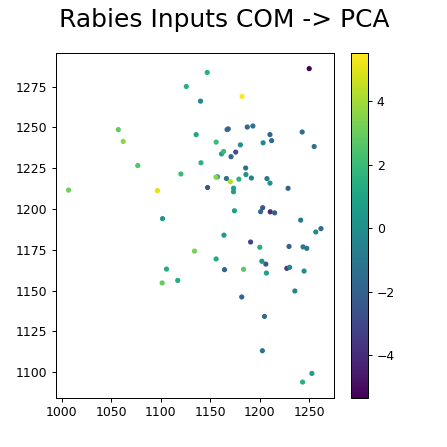

In [48]:
proj_df = input_df.copy()
Xcom=proj_df[['XCoordCOM','YCoordCOM','ZCoordCOM']].values
xcom = Xcom[:,0]; ycom = Xcom[:,1]; zcom = Xcom[:,2]

fig, ax = plt.subplots(1, 1)
fig.set_figheight(5)
fig.set_figwidth(5)
fig.suptitle("Rabies Inputs COM -> PCA", fontsize=20)
sc = ax.scatter(xcom,ycom,s=10, c=pca_scaled_embedding[:, 0])
plt.colorbar(sc)

#fig.savefig('../figures/inputs.pca-spatial-0.'+writebatch+'.png')
#fig.savefig('../figures/inputs.pca-spatial-0.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


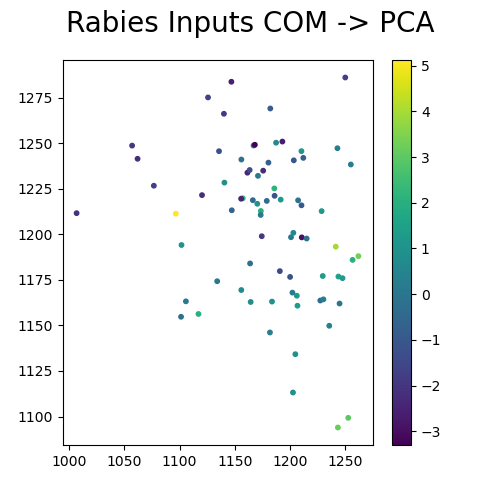

In [57]:
proj_df = input_df.copy()
Xcom=proj_df[['XCoordCOM','YCoordCOM','ZCoordCOM']].values
xcom = Xcom[:,0]; ycom = Xcom[:,1]; zcom = Xcom[:,2]

fig, ax = plt.subplots(1, 1)
fig.set_figheight(5)
fig.set_figwidth(5)
fig.suptitle("Rabies Inputs COM -> PCA", fontsize=20)
sc = ax.scatter(xcom,ycom,s=10, c=pca_scaled_embedding[:, 1])
plt.colorbar(sc)

fig.savefig('../figures/inputs.pca-spatial-1.'+writebatch+'.png')
fig.savefig('../figures/inputs.pca-spatial-1.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


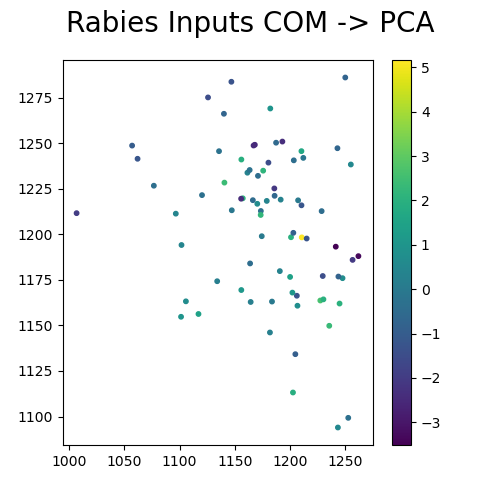

In [58]:
proj_df = input_df.copy()
Xcom=proj_df[['XCoordCOM','YCoordCOM','ZCoordCOM']].values
xcom = Xcom[:,0]; ycom = Xcom[:,1]; zcom = Xcom[:,2]

fig, ax = plt.subplots(1, 1)
fig.set_figheight(5)
fig.set_figwidth(5)
fig.suptitle("Rabies Inputs COM -> PCA", fontsize=20)
sc = ax.scatter(xcom,ycom,s=10, c=pca_scaled_embedding[:, 2])
plt.colorbar(sc)

fig.savefig('../figures/inputs.pca-spatial-2.'+writebatch+'.png')
fig.savefig('../figures/inputs.pca-spatial-2.'+writebatch+'.svg')

In [18]:
xslice = 13

labeled_brain  = tifffile.imread('vta.annot.tif')
masked_labeled_brain = numpy.ma.masked_where(labeled_brain==749,labeled_brain)

yu = 189
yd = 230
zl = 168
zr = 216

y1 = -(yu-253)*0.025+4
y2 = -(yd-253)*0.025+4
z1 = numpy.abs(zl-225)*0.025
z2 = numpy.abs(zr-225)*0.025
ext = [z1,z2,y1,y2]

In [19]:
print(min(xcom))
print(max(xcom))
print(min(ycom))
print(max(ycom))

1006.762
1262.0
1094.0
1286.0


In [20]:
print(yu)
print(yd)
print(zl)
print(zr)

189
230
168
216


In [21]:
xratio = (max(xcom)-min(xcom))/(zr-zl-15)
yratio = (max(ycom)-min(ycom))/(yd-yu-15)
print(xratio)
print(yratio)

7.7344848484848505
7.384615384615385


In [22]:
xcom_allen = (xcom - min(xcom))/xratio + zl+7.5
ycom_allen = (ycom - min(ycom))/yratio + yu+7.5

In [23]:
xmax_mm,xmin_mm,ymax_mm,ymin_mm = 1.425, 0.225, 5.6, 4.575

In [24]:
xratio_mm = (zr-zl)/(xmax_mm-xmin_mm)
yratio_mm = (yd-yu)/(ymax_mm-ymin_mm)

In [25]:
xcom_mm = (xcom_allen-zl)/xratio_mm + xmin_mm
ycom_mm = (ycom_allen-yu)/yratio_mm + ymin_mm

In [26]:
xcom_mm = (xcom_mm-xmax_mm)*(xmax_mm-xmin_mm)/(xmin_mm-xmax_mm)+xmin_mm

In [27]:
print(min(xcom_mm))
print(max(xcom_mm))

0.4125
1.2375000000000003


<IPython.core.display.Javascript object>


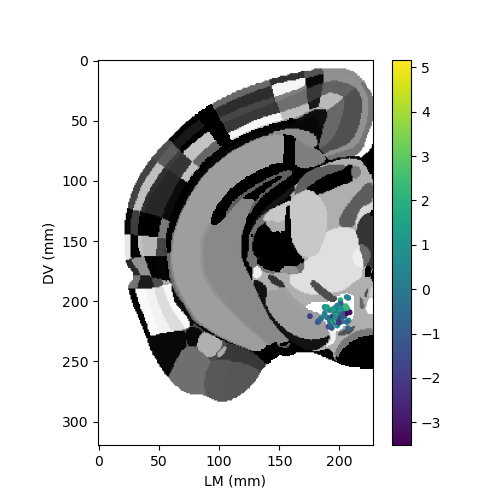

Text(0, 0.5, 'DV (mm)')

In [27]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,:,:], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1)

sc = ax.scatter(xcom_allen,ycom_allen,s=10, c=pca_scaled_embedding[:, 2])
plt.colorbar(sc)

ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
#plt.savefig("../figures/vtaannot-cropped.png")

<IPython.core.display.Javascript object>


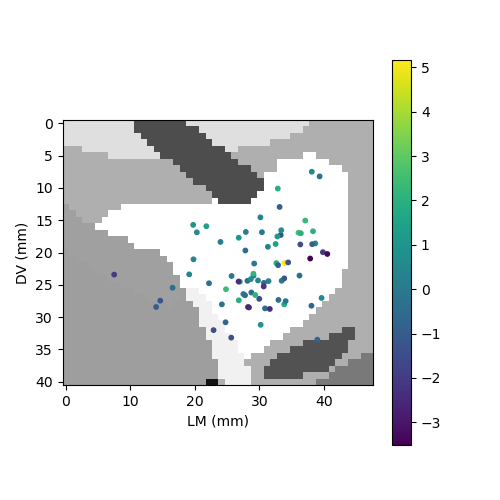

Text(0, 0.5, 'DV (mm)')

In [28]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1)
sc = ax.scatter(xcom_allen-zl,ycom_allen-yu,s=10, c=pca_scaled_embedding[:, 2])
plt.colorbar(sc)


ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
#plt.savefig("../figures/vtaannot-cropped.png")

<IPython.core.display.Javascript object>


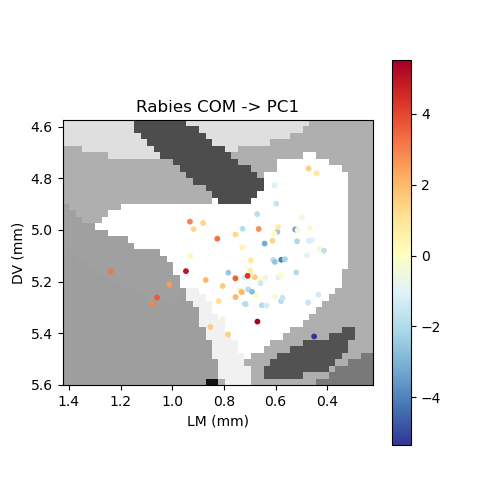

Text(0.5, 1.0, 'Rabies COM -> PC1')

In [29]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)
sc = ax.scatter(xcom_mm,ycom_mm,s=10, c=pca_scaled_embedding[:, 0],cmap='RdYlBu_r')
plt.colorbar(sc)

ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> PC1')
#fig.savefig('../figures/inputs.pca-spatial-1.'+writebatch+'.png')
#fig.savefig('../figures/inputs.pca-spatial-1.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


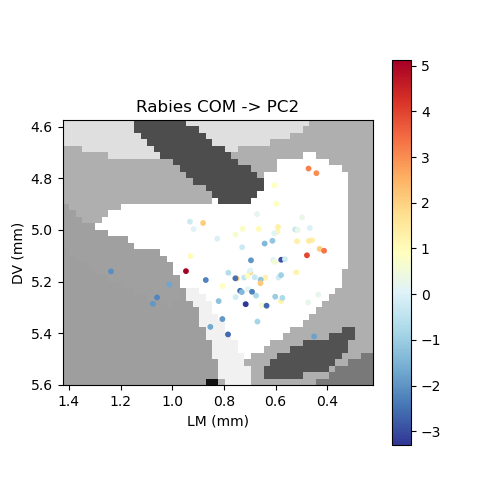

Text(0.5, 1.0, 'Rabies COM -> PC2')

In [30]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)
sc = ax.scatter(xcom_mm,ycom_mm,s=10, c=pca_scaled_embedding[:, 1],cmap='RdYlBu_r')
plt.colorbar(sc)

ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> PC2')
#fig.savefig('../figures/inputs.pca-spatial-2.'+writebatch+'.png')
#fig.savefig('../figures/inputs.pca-spatial-2.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


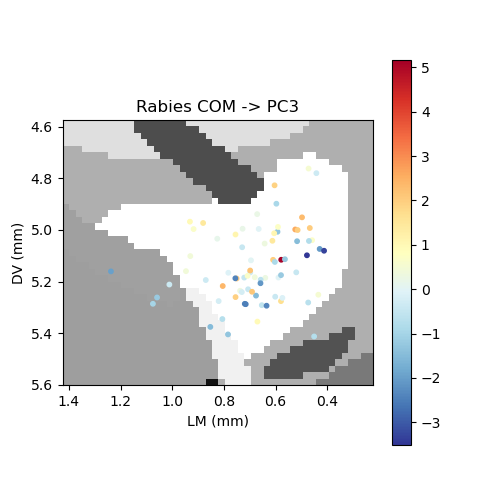

Text(0.5, 1.0, 'Rabies COM -> PC3')

In [34]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)
sc = ax.scatter(xcom_mm,ycom_mm,s=10, c=pca_scaled_embedding[:, 2],cmap='RdYlBu_r')
plt.colorbar(sc)

ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> PC3')
#fig.savefig('../figures/inputs.pca-spatial-3.'+writebatch+'.png')
#fig.savefig('../figures/inputs.pca-spatial-3.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


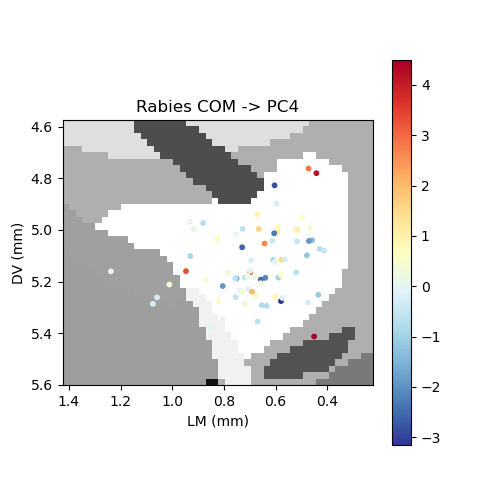

In [32]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)
sc = ax.scatter(xcom_mm,ycom_mm,s=10, c=pca_scaled_embedding[:, 3],cmap='RdYlBu_r')
plt.colorbar(sc)

ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> PC4')
fig.savefig('../figures/inputs.pca-spatial-4.'+writebatch+'.png')
fig.savefig('../figures/inputs.pca-spatial-4.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


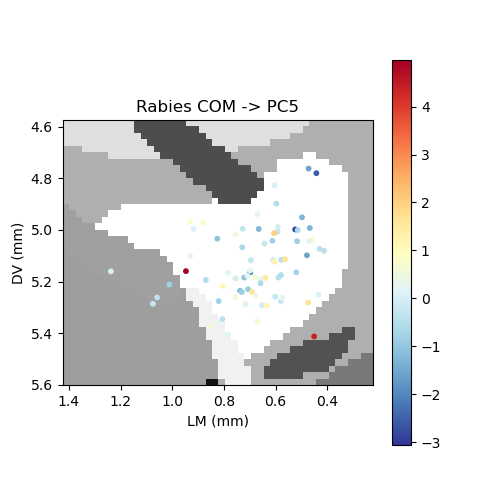

Text(0.5, 1.0, 'Rabies COM -> PC5')

In [33]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)
sc = ax.scatter(xcom_mm,ycom_mm,s=10, c=pca_scaled_embedding[:, 4],cmap='RdYlBu_r')
plt.colorbar(sc)

ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> PC5')
#fig.savefig('../figures/inputs.pca-spatial-3.'+writebatch+'.png')
#fig.savefig('../figures/inputs.pca-spatial-3.'+writebatch+'.svg')

# predict projections from pcs

In [35]:
from sklearn.linear_model import LogisticRegression

In [54]:
print(len(y))
print(Xcom.shape)
print(pca_scaled_embedding.shape)

76
(76, 3)
(76, 5)


In [134]:
pca3 = pca_scaled_embedding[:,:3]

In [148]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
y = [numpy.where(numpy.unique(projections)==p)[0][0] for p in projections]
model.fit(pca_scaled_embedding,y)
model.score(pca_scaled_embedding,y)

0.5789473684210527

In [137]:
for p in numpy.unique(projections):
    idxs = numpy.where(projections==p)[0]
    xsub = pca3[idxs,:]
    ysub = numpy.array(y)[idxs]
    #print(p)
    print(model.score(xsub,ysub))

0.625
0.875
0.3333333333333333
0.4375
0.4375


<IPython.core.display.Javascript object>


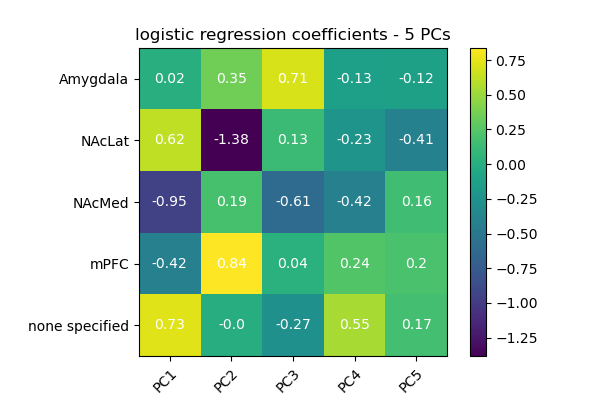

In [149]:
fig, ax = plt.subplots(figsize=(6,4))
im = ax.imshow(model.coef_,cmap='viridis')

ax.set_xticks(numpy.arange(5))
ax.set_yticks(numpy.arange(5))
# ... and label them with the respective list entries
ax.set_xticklabels(["PC"+str(i) for i in range(1,6)])
ax.set_yticklabels(numpy.unique(projections))

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(5):
    for j in range(5):
        text = ax.text(j, i, model.coef_[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("logistic regression coefficients - 5 PCs")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
plt.savefig('../figures/projection.logit.5pcs.'+writebatch+'.png')
plt.savefig('../figures/projection.logit.5pcs.'+writebatch+'.svg')
plt.show()


In [87]:
Xscale = preprocessing.scale(Xcom)

In [151]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
model.fit(Xscale,y)
model.score(Xscale,y)

0.47368421052631576

In [139]:
for p in numpy.unique(projections):
    idxs = numpy.where(projections==p)[0]
    xsub = Xscale[idxs,:]
    ysub = numpy.array(y)[idxs]
    #print(p)
    print(model.score(xsub,ysub))

0.4375
0.6875
0.5
0.625
0.125


<IPython.core.display.Javascript object>


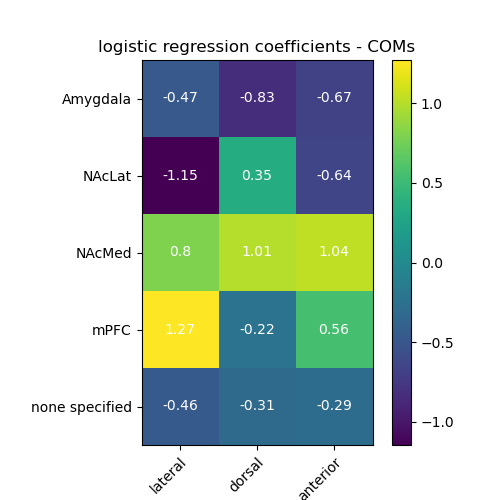

In [152]:
fig, ax = plt.subplots(figsize=(5,5))
im = ax.imshow(model.coef_,cmap='viridis')

ax.set_xticks(numpy.arange(3))
ax.set_yticks(numpy.arange(5))
# ... and label them with the respective list entries
ax.set_xticklabels(["lateral","dorsal","anterior"])
ax.set_yticklabels(numpy.unique(projections))

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(5):
    for j in range(3):
        text = ax.text(j, i, model.coef_[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("logistic regression coefficients - COMs")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
plt.savefig('../figures/projection.logit.com.'+writebatch+'.png')
plt.savefig('../figures/projection.logit.com.'+writebatch+'.svg')
plt.show()


In [120]:
feats = numpy.concatenate((pca_scaled_embedding,Xscale),axis=1)

In [153]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
model.fit(feats,y)
model.score(feats,y)

0.7236842105263158

In [141]:
for p in numpy.unique(projections):
    idxs = numpy.where(projections==p)[0]
    xsub = feats[idxs,:]
    ysub = numpy.array(y)[idxs]
    #print(p)
    print(model.score(xsub,ysub))

0.75
0.8125
0.75
0.625
0.6875


['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'lateral', 'dorsal', 'anterior']

<IPython.core.display.Javascript object>


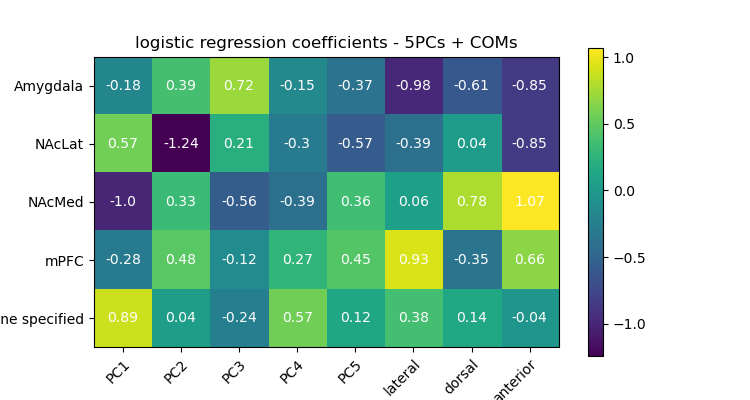

In [154]:
fig, ax = plt.subplots(figsize=(7.5,4))
im = ax.imshow(model.coef_,cmap='viridis')

ax.set_xticks(numpy.arange(8))
ax.set_yticks(numpy.arange(5))
# ... and label them with the respective list entries
ax.set_xticklabels(["PC"+str(i) for i in range(1,6)] + ["lateral","dorsal","anterior"])
ax.set_yticklabels(numpy.unique(projections))

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
for i in range(5):
    for j in range(8):
        text = ax.text(j, i, model.coef_[i, j].round(decimals=2),
                       ha="center", va="center", color="w")

ax.set_title("logistic regression coefficients - 5PCs + COMs")
#fig.tight_layout()

# Create colorbar
cbar = ax.figure.colorbar(im, ax=ax)
plt.savefig('../figures/projection.logit.5PCsandcom.'+writebatch+'.png')
plt.savefig('../figures/projection.logit.5PCsandcom.'+writebatch+'.svg')
plt.show()


In [39]:
projections = input_df["Output site:"].copy()
projections = projections.fillna(value="none specified")

In [35]:
for r in colors:
    print(r)

[0.5 0.  1.  1. ]
[0.00196078 0.70928131 0.92328911 1.        ]
[0.50392157 0.99998103 0.70492555 1.        ]
[1.         0.70054304 0.37841105 1.        ]
[1.0000000e+00 1.2246468e-16 6.1232340e-17 1.0000000e+00]


<IPython.core.display.Javascript object>


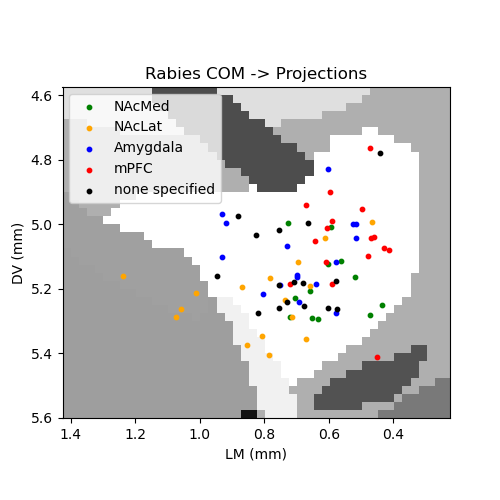

NAcMed
NAcLat
Amygdala
mPFC
none specified


In [38]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)

colors = {
    'NAcMed':'g',
    'NAcLat':'orange',
    'Amygdala':'blue',
    'mPFC':'r',
    'none specified': 'black'
}


for v in colors:
    print(v)
    x = xcom_mm[projections==v]
    y = ycom_mm[projections==v]
    ax.scatter(x,y,s=10,c=colors[v],label=v)



ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> Projections')
plt.legend()
fig.savefig('../figures/inputs.projections.'+writebatch+'.png')
fig.savefig('../figures/inputs.projections.'+writebatch+'.svg')

<IPython.core.display.Javascript object>


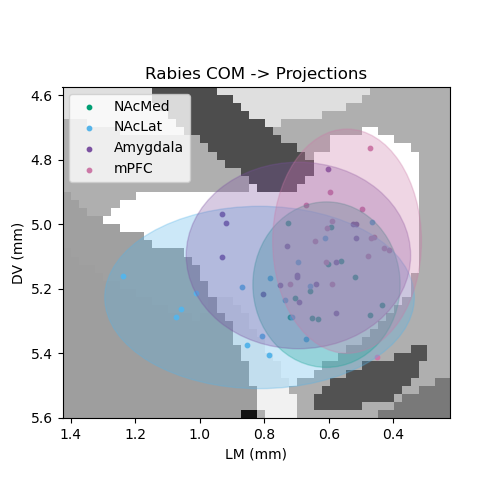

NAcMed
NAcLat
Amygdala
mPFC


In [59]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)

colors = {
    'NAcMed':'#009E73',
    'NAcLat':'#56B4E9',
    'Amygdala':'#7B51A1',
    'mPFC':'#CC79A7',
    #'none specified': 'black'
}


for v in colors:
    print(v)
    x = xcom_mm[projections==v]
    y = ycom_mm[projections==v]
    xmean = x.mean()
    ymean = y.mean()
    xstd = x.std()
    ystd = y.std()
    
    ellipse = Ellipse(xy=(xmean,ymean), width=5*xstd, height=5*ystd, 
                      edgecolor=colors[v], fc=colors[v],alpha=0.3)
    ax.add_patch(ellipse)
    ax.scatter(x,y,s=10,c=colors[v],label=v)



ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> Projections')
plt.legend()
fig.savefig('../figures/inputs.projections.'+writebatch+'.png')
fig.savefig('../figures/inputs.projections.'+writebatch+'.svg')

In [201]:
x.std()

0.12263772235314611

In [49]:
fig,ax = plt.subplots(1,1,figsize=(5,5))
#vta_pca_slice[0,:,:][vta_pca_slice[0,:,:] == 0.0] = numpy.nan
ax.imshow(masked_labeled_brain[xslice,(yu):(yd),(zl):(zr)], cmap='binary', aspect='equal', vmin=0, vmax=1000,alpha=1,extent=ext)
sc = ax.scatter(xcom_mm,ycom_mm,s=10, c=pca_scaled_embedding[:, 2],cmap='RdYlBu_r')
plt.colorbar(sc)

ax.set_xlabel('LM (mm)')
ax.set_ylabel('DV (mm)')
ax.set_title('Rabies COM -> PC3')
fig.savefig('../figures/inputs.projection.'+writebatch+'.png')
fig.savefig('../figures/inputs.projection.'+writebatch+'.svg')

(60, 32)

In [44]:
fig = plt.figure()
ax = Axes3D(fig)
colors = {
    'NAcMed':'b',
    'NAcLat':'orange',
    'Amygdala':'g',
    'mPFC':'r'
}
#c = [colors[val] for val in pcaembedding_df['projection'].values]

projection_df = pcaembedding_df.dropna(axis=0,subset=['projection'])


for v in numpy.unique(projection_df['projection'].values):
    print(v)
    vdf = projection_df.loc[projection_df['projection']==v]
    ax.scatter(vdf.iloc[:,0],vdf.iloc[:,1],vdf.iloc[:,2],
                s=25,c=colors[v],label=v)
ax.set_xlabel('pc1')
ax.set_ylabel('pc2')
ax.set_zlabel('pc3')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>

NameError: name 'pcaembedding_df' is not defined

<IPython.core.display.Javascript object>


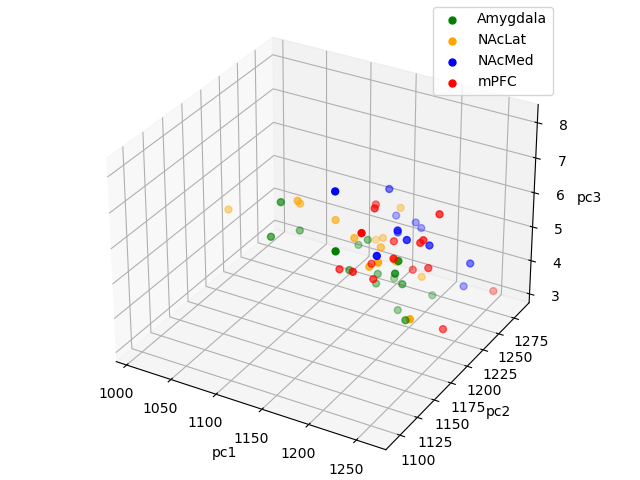

Amygdala
NAcLat
NAcMed
mPFC


In [45]:
fig = plt.figure()
ax = Axes3D(fig)
colors = {
    'NAcMed':'b',
    'NAcLat':'orange',
    'Amygdala':'g',
    'mPFC':'r'
}
#c = [colors[val] for val in pcaembedding_df['projection'].values]

proj_df = input_df.dropna(axis=0,subset=['Output site:'])


for v in numpy.unique(proj_df['Output site:'].values):
    print(v)
    vdf = proj_df.loc[proj_df['Output site:']==v]
    Xcom=vdf[['XCoordCOM','YCoordCOM','ZCoordCOM']].values
    xcom = Xcom[:,0]; ycom = Xcom[:,1]; zcom = Xcom[:,2]
    ax.scatter(xcom,ycom,zcom,
                s=25,c=colors[v],label=v)
ax.set_xlabel('pc1')
ax.set_ylabel('pc2')
ax.set_zlabel('pc3')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


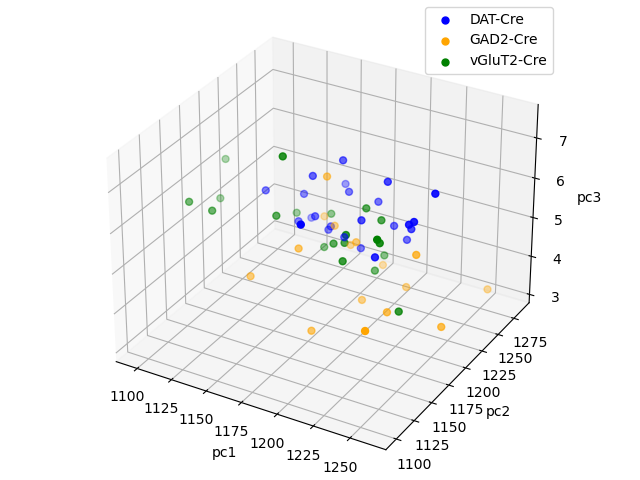

DAT-Cre
GAD2-Cre
vGluT2-Cre


In [46]:
fig = plt.figure()
ax = Axes3D(fig)
colors = {
    'DAT-Cre':'b',
    'GAD2-Cre':'orange',
    'vGluT2-Cre':'g'
}
#c = [colors[val] for val in pcaembedding_df['projection'].values]

cell_df = input_df.dropna(axis=0,subset=['Cre line:'])


for v in numpy.unique(cell_df['Cre line:'].values):
    print(v)
    vdf = cell_df.loc[cell_df['Cre line:']==v]
    Xcom=vdf[['XCoordCOM','YCoordCOM','ZCoordCOM']].values
    xcom = Xcom[:,0]; ycom = Xcom[:,1]; zcom = Xcom[:,2]
    ax.scatter(xcom,ycom,zcom,
                s=25,c=colors[v],label=v)
ax.set_xlabel('pc1')
ax.set_ylabel('pc2')
ax.set_zlabel('pc3')
plt.legend()
plt.show()

In [55]:
plotly.io.write_html(fig, file='../figures/vta.spatial.pca.'+writebatch+'.html')

In [44]:
numpy.savetxt('../data/vtasccomcoords.csv', Xcom, delimiter=",")
numpy.savetxt('../data/vtarabies-inputs.pca.csv', pca_scaled_embedding, delimiter=",")

In [ ]:
xcom_mm
ycom_mm
pca_scaled_embedding

In [41]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

In [37]:
Xs = numpy.stack((xcom_mm,ycom_mm),axis=1)

In [38]:
y1 = pca_scaled_embedding[:,0]
y2 = pca_scaled_embedding[:,1]
y3 = pca_scaled_embedding[:,2]
y4 = pca_scaled_embedding[:,3]
y5 = pca_scaled_embedding[:,4]

In [42]:
model = LinearRegression().fit(Xs, y1)
print(model.score(Xs,y1))
print(model.intercept_)
print(model.coef_)

0.3587943175315863
5.094362927711344
[ 8.07687131 -2.05741979]


In [43]:
X2 = sm.add_constant(Xs)
est = sm.OLS(y1, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.359
Model:                            OLS   Adj. R-squared:                  0.341
Method:                 Least Squares   F-statistic:                     20.42
Date:                Tue, 21 Sep 2021   Prob (F-statistic):           9.02e-08
Time:                        14:53:07   Log-Likelihood:                -148.58
No. Observations:                  76   AIC:                             303.2
Df Residuals:                      73   BIC:                             310.1
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.0944      7.546      0.675      0.5

In [76]:
model = LinearRegression().fit(Xs, y2)
print(model.score(Xs,y2))
print(model.intercept_)
print(model.coef_)

0.29860473974375035
29.066405264196394
[-2.28719444 -5.3551582 ]


In [44]:
X2 = sm.add_constant(Xs)
est = sm.OLS(y2, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.299
Model:                            OLS   Adj. R-squared:                  0.279
Method:                 Least Squares   F-statistic:                     15.54
Date:                Tue, 21 Sep 2021   Prob (F-statistic):           2.39e-06
Time:                        14:56:38   Log-Likelihood:                -133.43
No. Observations:                  76   AIC:                             272.9
Df Residuals:                      73   BIC:                             279.9
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         29.0664      6.182      4.702      0.0

In [77]:
model = LinearRegression().fit(Xs, y3)
print(model.score(Xs,y3))
print(model.intercept_)
print(model.coef_)

0.07590316268334041
15.671901650277837
[ 0.25779719 -3.08414434]


In [45]:
X2 = sm.add_constant(Xs)
est = sm.OLS(y3, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.076
Model:                            OLS   Adj. R-squared:                  0.051
Method:                 Least Squares   F-statistic:                     2.998
Date:                Tue, 21 Sep 2021   Prob (F-statistic):             0.0561
Time:                        14:56:54   Log-Likelihood:                -136.23
No. Observations:                  76   AIC:                             278.5
Df Residuals:                      73   BIC:                             285.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.6719      6.415      2.443      0.0

In [78]:
model = LinearRegression().fit(Xs, y4)
print(model.score(Xs,y4))
print(model.intercept_)
print(model.coef_)

0.010195437430672638
5.343814226921918
[ 0.03989979 -1.04529807]


In [46]:
X2 = sm.add_constant(Xs)
est = sm.OLS(y4, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                 -0.017
Method:                 Least Squares   F-statistic:                    0.3760
Date:                Tue, 21 Sep 2021   Prob (F-statistic):              0.688
Time:                        14:57:18   Log-Likelihood:                -133.72
No. Observations:                  76   AIC:                             273.4
Df Residuals:                      73   BIC:                             280.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.3438      6.206      0.861      0.3

In [79]:
model = LinearRegression().fit(Xs, y5)
print(model.score(Xs,y5))
print(model.intercept_)
print(model.coef_)

0.12218527151513525
-15.158539406327693
[0.40027298 2.89738382]


In [47]:
X2 = sm.add_constant(Xs)
est = sm.OLS(y5, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.098
Method:                 Least Squares   F-statistic:                     5.081
Date:                Tue, 21 Sep 2021   Prob (F-statistic):            0.00859
Time:                        14:57:31   Log-Likelihood:                -117.24
No. Observations:                  76   AIC:                             240.5
Df Residuals:                      73   BIC:                             247.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -15.1585      4.996     -3.034      0.0

In [52]:
log_reg = sm.Logit(projections.values, Xs).fit()

TypeError: '>=' not supported between instances of 'str' and 'int'

In [33]:
Xs.shape

NameError: name 'Xs' is not defined

In [57]:
projections.values

array(['Amygdala', 'Amygdala', 'Amygdala', 'Amygdala', 'NAcLat', 'NAcLat',
       'NAcLat', 'NAcLat', 'NAcMed', 'NAcMed', 'NAcMed', 'NAcMed', 'mPFC',
       'mPFC', 'mPFC', 'mPFC', 'Amygdala', 'Amygdala', 'Amygdala',
       'Amygdala', 'NAcLat', 'NAcLat', 'NAcLat', 'NAcLat', 'mPFC', 'mPFC',
       'mPFC', 'mPFC', 'Amygdala', 'Amygdala', 'Amygdala', 'Amygdala',
       'NAcLat', 'NAcLat', 'NAcLat', 'NAcLat', 'NAcMed', 'NAcMed',
       'NAcMed', 'NAcMed', 'mPFC', 'mPFC', 'mPFC', 'mPFC',
       'none specified', 'none specified', 'none specified',
       'none specified', 'none specified', 'none specified',
       'none specified', 'none specified', 'none specified',
       'none specified', 'none specified', 'none specified', 'Amygdala',
       'Amygdala', 'Amygdala', 'Amygdala', 'NAcLat', 'NAcLat', 'NAcLat',
       'NAcLat', 'NAcMed', 'NAcMed', 'NAcMed', 'NAcMed', 'mPFC', 'mPFC',
       'mPFC', 'mPFC', 'none specified', 'none specified',
       'none specified', 'none specified'], dtype=

# Color by UMAP Cluster

In [35]:
umapembedding_df = pandas.read_csv('../data/inputs.umap.scaled.20210521.csv',index_col=0)

In [36]:
umapembedding_df

,umap-1d,umap-2d,cell type,projection
0,8.251710,0.862158,DAT-Cre,Amygdala
1,6.144191,4.192509,DAT-Cre,Amygdala
2,8.329709,0.543943,DAT-Cre,Amygdala
3,7.290886,3.022474,DAT-Cre,Amygdala
4,0.943089,2.776775,DAT-Cre,NAcLat
...,...,...,...,...
71,-0.490702,6.166754,none specified,mPFC
72,-1.842886,5.428807,vGluT2-Cre,none specified
73,-2.236402,5.162295,vGluT2-Cre,none specified
74,7.947491,1.118254,vGluT2-Cre,none specified


In [45]:
umap_scaled_embedding = umapembedding_df[['umap-1d','umap-2d']].to_numpy()

In [42]:
umap_scaled_embedding=umap.UMAP(n_neighbors=5,min_dist=0.1,metric='euclidean').fit_transform(scaled_features)

In [48]:
clusterer=hdbscan.HDBSCAN(min_cluster_size=3)

clusterer.fit(umap_scaled_embedding)

color_palette = seaborn.color_palette('hls', (numpy.max(clusterer.labels_+1)))
cluster_colors = [color_palette[x] if x>= 0
                  else (0.5, 0.5, 0.5)
                  for x in clusterer.labels_]
cluster_member_colors = [seaborn.desaturate(x, p) for x, p in
                        zip(cluster_colors, clusterer.probabilities_)]
umap_cluster_colors_hex=['#%02x%02x%02x' %tuple(int(c*256) for c in l) for l in cluster_member_colors]

fig=go.Figure(data=go.Scatter(
    y=umap_scaled_embedding[:, 1],
    x=umap_scaled_embedding[:, 0],
    mode='markers',
    marker_color=umap_cluster_colors_hex,
    text=input_df['Experimental condition'],
    hoverinfo="text"
    ))

fig.update_layout(
    width=800,
    height=800,
    xaxis_title='UMAP 1D',
    yaxis_title='UMAP 2D',
    title={
        'text': "VTA Inputs - UMAP By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)


In [51]:
fig = go.Figure(data=go.Scatter3d(
    x=xcom, 
    y=ycom, 
    z=zcom,
    mode='markers',
    marker_color = umap_cluster_colors_hex,
    text=input_df['Experimental condition'],
    hoverinfo="text"
))

fig.update_layout(
    width=800,
    height=800,
    title={
        'text': "VTA Inputs - PCA By Cell Type and Outputs",
        'x': 0.5
    },
    xaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    },
    yaxis={
        'showline':True,
        'showgrid':False, 
        'ticks':'outside',
        'mirror':True,
        'zeroline':False
    }
)

fig.show()

In [57]:
plotly.io.write_html(fig, file='../figures/vta.spatial.umap.'+writebatch+'.html')

In [46]:
numpy.savetxt('../data/vtarabies-inputs.umap.csv', umap_scaled_embedding, delimiter=",")

In [69]:
regions

array(['Cortex', 'NAcMed', 'NAcLat', 'NAcCore', 'DStr', 'VP', 'PO',
       'Septum', 'BNST', 'EAM', 'EP', 'Gpe', 'PVH', 'LHb', 'MHb', 'CeA',
       'LH', 'ZI', 'DR', 'LDT', 'PBN', 'DCN'], dtype='<U7')

In [70]:
roi = numpy.array(['NAcCore','DR','DStr','Gpe','DCN','LH'])
biomarker_df = numpy.log(scaled_features.copy()+3)

In [66]:
biomarker_df[:,r]

array([], shape=(76, 0, 1), dtype=float64)

In [62]:
regions=numpy.array(regions)

In [58]:
regions

['Cortex',
 'NAcMed',
 'NAcLat',
 'NAcCore',
 'DStr',
 'VP',
 'PO',
 'Septum',
 'BNST',
 'EAM',
 'EP',
 'Gpe',
 'PVH',
 'LHb',
 'MHb',
 'CeA',
 'LH',
 'ZI',
 'DR',
 'LDT',
 'PBN',
 'DCN']

<IPython.core.display.Javascript object>


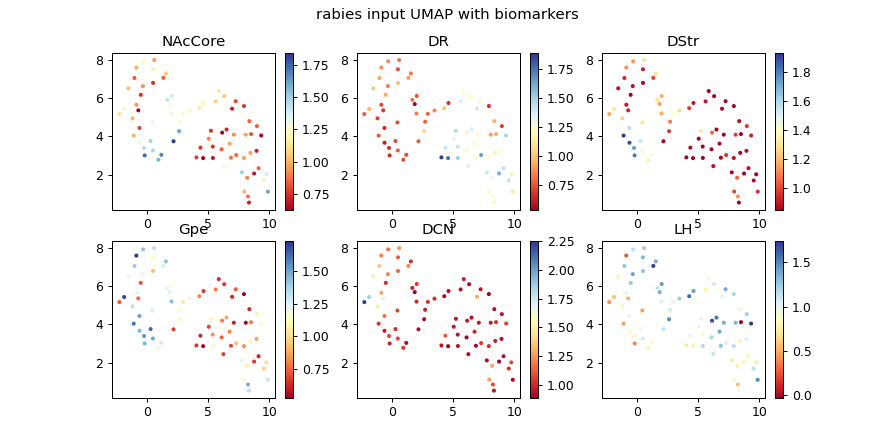

In [73]:
fig,ax = plt.subplots(2,3,figsize=(10,5))

cm = plt.cm.get_cmap('RdYlBu')
region_idx = [1,2,9,13,20,21]
idx = 0
for i in [0,1]:
    for j in [0,1,2]:
        r = numpy.argwhere(regions==roi[idx])
        sc = ax[i][j].scatter(umap_scaled_embedding[:,0],umap_scaled_embedding[:,1],c=biomarker_df[:,r],s=5,cmap=cm)
        plt.colorbar(sc,ax=ax[i][j])
        ax[i][j].set_title(roi[idx])
        idx=idx+1
fig.suptitle('rabies input UMAP with biomarkers')
plt.savefig('../figures/rabies-inputs.umap.biomarkers.png')

<IPython.core.display.Javascript object>


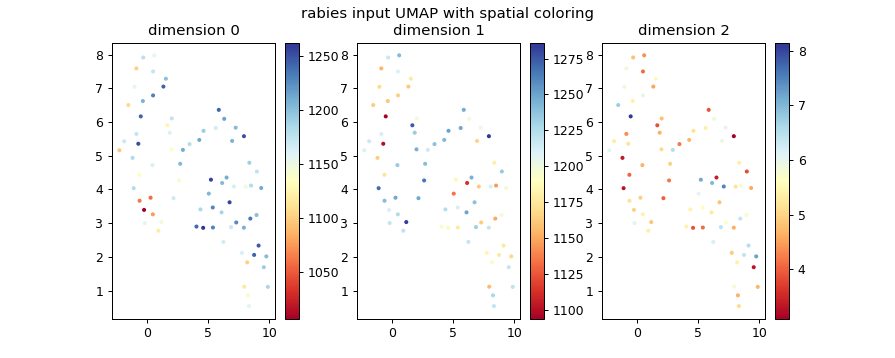

In [83]:
fig,ax = plt.subplots(1,3,figsize=(10,4))

cm = plt.cm.get_cmap('RdYlBu')
region_idx = [1,2,9,13,20,21]
for i in [0,1,2]:
    x = Xcom[:,i]
    sc = ax[i].scatter(umap_scaled_embedding[:,0],umap_scaled_embedding[:,1],c=x,s=5,cmap=cm)
    plt.colorbar(sc,ax=ax[i])
    ax[i].set_title('dimension ' + str(i))
fig.suptitle('rabies input UMAP with spatial coloring')
plt.savefig('../figures/rabies-inputs.umap.spatial.png')

# Plot Spheroids From Paper

In [34]:
naclat_id = [29,30,31,32]
nacmed_id = [33,34,35,57]
pfc_id = [36,37,38,58]
bla_id = [39,40,41,59]

ctriodat_id = naclat_id + nacmed_id + pfc_id + bla_id

In [35]:
starter_com = pandas.read_excel("../data/SC for stanley for sag.xlsx",sheet_name="500 nL corr",header=None,names=['brain','z','x','y'])

In [36]:
#starter_com.dropna(axis=0, inplace = True)

In [37]:
print("x: ", str(xcom.min()), str(xcom.max()))
print("y: ", str(ycom.min()), str(ycom.max()))
print("z: ", str(zcom.min()), str(zcom.max()))

x:  1006.762 1262.0
y:  1094.0 1286.0
z:  3.1 8.142857


In [38]:
naclat_idx = []
nacmed_idx = []
pfc_idx = []
bla_idx = []

In [39]:
for i,row in starter_com.iterrows():
    if row.brain not in ctriodat_id:
        continue
    if row.brain in naclat_id:
        naclat_idx.append(i)
    elif row.brain in nacmed_id:
        nacmed_idx.append(i)
    elif row.brain in pfc_id:
        pfc_idx.append(i)
    elif row.brain in bla_id:
        bla_idx.append(i)

In [40]:
X = starter_com[['y','x','z']].values
x = X[:,0]; y = X[:,1]; z = X[:,2]

In [41]:
def zpixel2slice(zpix):
    return (1926-zpix)/(1926-1744)*9

In [42]:
zcorrected = numpy.array(list(map(zpixel2slice,z)))

In [43]:
X = numpy.array([x,y,zcorrected])

In [44]:
naclat_points = X[:,naclat_idx]
nacmed_points = X[:,nacmed_idx]
pfc_points = X[:,pfc_idx]
bla_points = X[:,bla_idx]

In [45]:
naclat_com_x,naclat_com_y,naclat_com_z  = numpy.mean(naclat_points,axis=1)
nacmed_com_x,nacmed_com_y,nacmed_com_z  = numpy.mean(nacmed_points,axis=1)
pfc_com_x,pfc_com_y,pfc_com_z  = numpy.mean(pfc_points,axis=1)
bla_com_x,bla_com_y,bla_com_z  = numpy.mean(bla_points,axis=1)

In [46]:
naclat_xrad,naclat_yrad,naclat_zrad = numpy.std(naclat_points,axis=1)
nacmed_xrad,nacmed_yrad,nacmed_zrad = numpy.std(nacmed_points,axis=1)
pfc_xrad,pfc_yrad,pfc_zrad = numpy.std(pfc_points,axis=1)
bla_xrad,bla_yrad,bla_zrad = numpy.std(bla_points,axis=1)

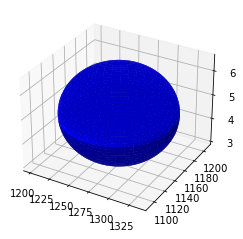

In [47]:
phi = numpy.linspace(0,2*numpy.pi, 256).reshape(256, 1) # the angle of the projection in the xy-plane
theta = numpy.linspace(0, numpy.pi, 256).reshape(-1, 256) # the angle from the polar axis, ie the polar angle

# Transformation formulae for a spherical coordinate system.
naclat_x = naclat_xrad*numpy.sin(theta)*numpy.cos(phi)+naclat_com_x
naclat_y = naclat_yrad*numpy.sin(theta)*numpy.sin(phi)+naclat_com_y
naclat_z = naclat_zrad*numpy.cos(theta)+naclat_com_z

fig = plt.figure(figsize=plt.figaspect(1))  # Square figure
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(naclat_x, naclat_y, naclat_z, color='b')

In [48]:
nacmed_x = nacmed_xrad*numpy.sin(theta)*numpy.cos(phi)+nacmed_com_x
nacmed_y = nacmed_yrad*numpy.sin(theta)*numpy.sin(phi)+nacmed_com_y
nacmed_z = nacmed_zrad*numpy.cos(theta)+nacmed_com_z

pfc_x = pfc_xrad*numpy.sin(theta)*numpy.cos(phi)+pfc_com_x
pfc_y = pfc_yrad*numpy.sin(theta)*numpy.sin(phi)+pfc_com_y
pfc_z = pfc_zrad*numpy.cos(theta)+pfc_com_z

bla_x = bla_xrad*numpy.sin(theta)*numpy.cos(phi)+bla_com_x
bla_y = bla_yrad*numpy.sin(theta)*numpy.sin(phi)+bla_com_y
bla_z = bla_zrad*numpy.cos(theta)+bla_com_z

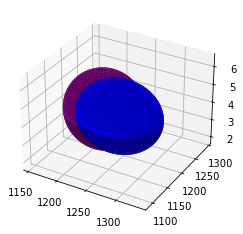

In [49]:
fig = plt.figure(figsize=plt.figaspect(1))  # Square figure
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(naclat_x, naclat_y, naclat_z, color='b')
ax.plot_surface(nacmed_x, nacmed_y, nacmed_z, color='r')
ax.plot_surface(pfc_x, pfc_y, pfc_z, color='g')
ax.plot_surface(bla_x, bla_y, bla_z, color='purple')


In [50]:
phi = numpy.linspace(0,2*numpy.pi) # the angle of the projection in the xy-plane
theta = numpy.linspace(0, numpy.pi) # the angle from the polar axis, ie the polar angle
phi, theta = numpy.meshgrid(phi,theta)


# Transformation formulae for a spherical coordinate system.
naclat_x = naclat_xrad*numpy.sin(theta)*numpy.cos(phi)+naclat_com_x
naclat_y = naclat_yrad*numpy.sin(theta)*numpy.sin(phi)+naclat_com_y
naclat_z = naclat_zrad*numpy.cos(theta)+naclat_com_z

nacmed_x = nacmed_xrad*numpy.sin(theta)*numpy.cos(phi)+nacmed_com_x
nacmed_y = nacmed_yrad*numpy.sin(theta)*numpy.sin(phi)+nacmed_com_y
nacmed_z = nacmed_zrad*numpy.cos(theta)+nacmed_com_z

pfc_x = pfc_xrad*numpy.sin(theta)*numpy.cos(phi)+pfc_com_x
pfc_y = pfc_yrad*numpy.sin(theta)*numpy.sin(phi)+pfc_com_y
pfc_z = pfc_zrad*numpy.cos(theta)+pfc_com_z

bla_x = bla_xrad*numpy.sin(theta)*numpy.cos(phi)+bla_com_x
bla_y = bla_yrad*numpy.sin(theta)*numpy.sin(phi)+bla_com_y
bla_z = bla_zrad*numpy.cos(theta)+bla_com_z

In [51]:
fig = go.Figure()

fig.add_trace(go.Mesh3d(
    x=naclat_x.flatten(), 
    y=naclat_y.flatten(), 
    z=naclat_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "NAcLat"
))

fig.add_trace(go.Mesh3d(
    x=nacmed_x.flatten(), 
    y=nacmed_y.flatten(), 
    z=nacmed_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "NAcMed"
))

fig.add_trace(go.Mesh3d(
    x=pfc_x.flatten(), 
    y=pfc_y.flatten(), 
    z=pfc_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "PFC"
))

fig.add_trace(go.Mesh3d(
    x=bla_x.flatten(), 
    y=bla_y.flatten(), 
    z=bla_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "BLA"
))


fig.show()

In [52]:
fig = go.Figure()

fig.add_trace(go.Scatter3d(
    x=xcom, 
    y=ycom, 
    z=zcom,
    mode='markers',
    marker_color = colors_hsvuv,
    text=input_df['Experimental condition'],
    hoverinfo="text"
))

fig.add_trace(go.Mesh3d(
    x=naclat_x.flatten(), 
    y=naclat_y.flatten(), 
    z=naclat_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "NAcLat"
))

fig.add_trace(go.Mesh3d(
    x=nacmed_x.flatten(), 
    y=nacmed_y.flatten(), 
    z=nacmed_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "NAcMed"
))

fig.add_trace(go.Mesh3d(
    x=pfc_x.flatten(), 
    y=pfc_y.flatten(), 
    z=pfc_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "PFC"
))

fig.add_trace(go.Mesh3d(
    x=bla_x.flatten(), 
    y=bla_y.flatten(), 
    z=bla_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    text = "BLA"
))

#fig.update_layout(hovermode='x')


fig.show()



In [53]:
fig = go.Figure()

fig.add_trace(go.Mesh3d(
    x=naclat_x.flatten(), 
    y=naclat_y.flatten(), 
    z=naclat_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    #name = "NAcLat"
))

fig.add_trace(go.Mesh3d(
    x=nacmed_x.flatten(), 
    y=nacmed_y.flatten(), 
    z=nacmed_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    #name = "NAcMed"
))

fig.add_trace(go.Mesh3d(
    x=pfc_x.flatten(), 
    y=pfc_y.flatten(), 
    z=pfc_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    #name = "PFC"
))

fig.add_trace(go.Mesh3d(
    x=bla_x.flatten(), 
    y=bla_y.flatten(), 
    z=bla_z.flatten(),
    alphahull = 0,
    opacity=0.1,
    #name = "BLA"
))


fig.add_trace(go.Scatter3d(
    x=xcom, 
    y=ycom, 
    z=zcom,
    mode='markers',
    marker_color = umap_cluster_colors_hex,
    text=input_df['Experimental condition'],
    hoverinfo="text"
))


fig.show()
